# Config
Configurazioni generali dell'addestramento:

In [ ]:

import torch

BATCH_SIZE = 1024

NUM_CLASSES = 10
EPOCHS = 50
DEVICE = torch.device("mps") #torch.device("cuda")

TRAIN_DATASET_PATH = "dataset_zoo/svhn/train_32x32.mat" #"/kaggle/input/svhn-dataset/train_32x32.mat"
VALID_DATASET_PATH = "dataset_zoo/svhn/test_32x32.mat" #"/kaggle/input/svhn-dataset/test_32x32.mat"
CLASSIFIER_PATH = "models_zoo/cnn/models/number_classifier.pth" #"/kaggle/input/number-classifier/pytorch/default/1/number_classifier.pth"
CHECKPOINT_PATH = "models_zoo/gan/models/number_generator.pth"

# Rete
La rete sviluppata si basa sul paper WGAN-GP e prevede un critico e un generatore con una struttura convoluzionale.

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear)):
        nn.init.normal_(m.weight, 0.0, 0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.constant_(m.bias, 0)
        
class ConvCritic(nn.Module):
    """
    Critico convoluzionale per valutare se un'immagine è reale o no.
        
    Args:
        num_classes (int): Numero di classi nel dataset.
        ndf (int): Numero di feature maps del discriminatore.
        nc (int): Numero di canali in input dell'immagine.
    """
    def __init__(self, num_classes: int, ndf: int = 64, nc: int = 3):
        super().__init__()
        self.num_classes = num_classes
        self.model = nn.Sequential(
            nn.Conv2d(nc + num_classes, ndf, kernel_size=4, stride=2, padding=1, bias=False), # nc * 2 x 32 x 32 -> ndf x 16 x 16
            nn.InstanceNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf, ndf * 2, kernel_size=4, stride=2, padding=1, bias=False), # ndf x 16 x 16 -> 2*ndf x 8 x 8
            nn.InstanceNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=4, stride=2, padding=1, bias=False), # 2*ndf*8x8 -> 4*ndf*4x4
            nn.InstanceNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*4, 1, kernel_size=4, stride=1, padding=0, bias=False), # 4*ndf*4x4 -> 1x1x1
            nn.Flatten()
        )
        self.apply(weights_init)
        
    def forward(self, x: torch.Tensor, l: torch.Tensor) -> torch.Tensor:
        l = F.one_hot(l, num_classes=self.num_classes).float()
        l = l.unsqueeze(2).unsqueeze(3)
        l = l.expand(-1, -1, x.size(2), x.size(3))
        x_cond = torch.cat([x, l], dim=1)
        
        x = self.model(x_cond)     
        return x

class ConvGenerator(nn.Module):
    """
    Generatore convoluzionale per generare immagini.

    Args:
        num_classes (int): Numero di classi nel dataset.
        nz (int): Dimensione del vettore di rumore.
        ngf (int): Numero di feature maps nel generatore.
        nc (int): Numero di canali in output dell'immagine.
    """
    def __init__(self, num_classes: int, nz: int = 100, ngf: int = 64, nc: int = 3):
        super(ConvGenerator, self).__init__()
        self.num_classes = num_classes
        self.nz = nz
        self.model = nn.Sequential(
            nn.ConvTranspose2d(nz + num_classes, ngf * 4, 4, 1, 0, bias=False), # ngf*4 x 4 x 4
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False), # ngf*4 x 4 x 4 -> ngf*2 x 8 x 8
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False), # ngf*2 x 8 x 8 -> ngf x 16 x 16
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False), # ngf x 16 x 16 -> nc x 32 x 32
            nn.Tanh()
        )
        self.apply(weights_init)

    def forward(self, z: torch.Tensor, l: torch.Tensor):
        l = F.one_hot(l, num_classes=self.num_classes).float()
        z_cond = torch.cat([z, l], dim=1)
        z_cond = z_cond.unsqueeze(2).unsqueeze(3) # [B, nz+num_classes] -> [B, nz+num_classes, 1, 1]
        return self.model(z_cond)

# Trainer
L'addestramento della rete prevede l'utilizzo della EmdLoss per calcolare la perdita del modello:

In [3]:
import torch
import torch.nn as nn

def gradient_penality(model_c: nn.Module, real_data: torch.Tensor, real_labels: torch.Tensor, fake_data: torch.Tensor, fake_labels: torch.Tensor) -> torch.Tensor:
    """
    Calcola la gradient penality per forzare il critico a essere una funzione 1-Lipschitz (varazione in uscita non supera la varazione in input).
    
    Formula: 
        lambda*Mean((||∇_{hat_x}(D(hat_x))|| - 1)^2) 
    dove hat_x è il batch di immagini interpolate tra le immagini reali e quella false.
    
    Args:
        model_c (nn.Module): istanza del critico.
        real_data (torch.Tensor): Dati reali.
        real_labels (torch.Tensor): Etichette dei dati reali.
        fake_data (torch.Tensor): Dati falsi.

    Returns:
        torch.Tensor: La perdita di gradient penalty.
    """
    batch_size = real_data.size(0)
    
    # Epsilon per ottenere una distribuzione uniforme
    eps = torch.rand(batch_size, 1, 1, 1).to(real_data.device)
    eps = eps.expand_as(real_data)
    
    # Interpolazione tra dati reali e dati finti
    interpolated_images = eps * real_data + (1 - eps) * fake_data
    interpolated_images = interpolated_images.requires_grad_(True)
    interpolated_labels = real_labels
    
    # Ritorna gli scores sulle immagini
    interp_logits = model_c(interpolated_images, interpolated_labels)        
    grad_outputs = torch.ones_like(interp_logits, device=real_data.device)
    
    # Calcola il gradiente
    gradients = torch.autograd.grad(
        outputs=interp_logits,
        inputs=interpolated_images,
        grad_outputs=grad_outputs,
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    
    # Calcola e ritorna la norma del gradiente
    gradients = gradients.view(batch_size, -1)
    grad_norm = torch.norm(gradients, 2, dim=1)
    return torch.mean((grad_norm - 1) ** 2)


class EmdCriticLoss(nn.Module):
    """
    Funzione di perdita per il critico basata sulla distanza di Earth Mover (EMD).
    """
    def __init__(self):
        super().__init__()
        
    def forward(self, real_logits: torch.Tensor, fake_logits: torch.Tensor) -> torch.Tensor:
        """
        Calcola la perdita per il critico basata sulla distanza di Earth Mover (EMD).

        Args:
            real_logits (torch.Tensor): tensore contenente i logits dei punteggi reali.
            fake_logits (torch.Tensor): tensore contenente i logits punteggi falsi.

        Returns:
            torch.Tensor: valore scalare della perdita.
        """
        emd_loss = -(real_logits - fake_logits).mean()
        return emd_loss 
        
class EmdGeneratorLoss(nn.Module):
    """
    Funzione di perdita per il generatore basata sulla distanza di Earth Mover (EMD).
    """
    def __init__(self):
        super().__init__()
    
    def forward(self, fake_logits: torch.Tensor):
        """
        Calcola la perdita per il generatore basata sulla distanza di Earth Mover (EMD).

        Args:
            fake_logits (torch.Tensor): tensore contenente i logits dei punteggi falsi da massimizzare.

        Returns:
            torch.Tensor: valore scalare della perdita.
        """
        emd_loss = -fake_logits.mean()
        return emd_loss

Per ogni epoca di addestramento verranno calcolate le metriche:
- Confusion matrix, usando il classificatore precedentemente implementato si andranno a classificare le immagini generate in modo da capire se effettivamente il modello sta generando immagini seguendo il condizionamento in input.
- Peak-Rmse, per capire quanto le immagini generate sono (anche lontamente) simili a quelle del dataset.

In [4]:
import torch
import torch.nn as nn
import numpy as np

def weights_init(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.ones_(m.weight)
        nn.init.zeros_(m.bias)
        
class NumberClassifier(nn.Module):
    """
    Classificatore di numeri.

    Args:
        num_classes (int): numero di classi in cui classificare le immagini.
    """
    def __init__(self, num_classes: int = 10):
        super().__init__()
        
        self.num_classes = num_classes
        
        self.model = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=2, stride=2, padding=0), # 32x3x3 -> 64x16x16
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.1),
            
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=2, stride=2, padding=0), # 64x16x16 -> 128x8x8
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.2),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=2, stride=2, padding=0), # 128x8x8 -> 256x4x4
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.3),
            
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=2, stride=2, padding=0), # 256x4x4 -> 512x2x2
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.4),
            
            nn.Flatten()
        )  
        self.fc = nn.Linear(512 * 2 * 2, out_features=num_classes)
        self.apply(weights_init)
        
    def forward(self, x: torch.Tensor, features: bool = False) -> torch.Tensor:
        x = self.model(x)
        l = self.fc(x)
        
        if features:
            return l, x
        return l
    
class NumberClassifierPredictor:
    def __init__(
        self, 
        model_path: str, 
        num_classes: int, 
        device: str):
        
        self.device = device
        self.model = NumberClassifier(num_classes).to(self.device)
        self.model.load_state_dict(torch.load(model_path, map_location=self.device))
        
    def predict(
        self, 
        x: torch.Tensor) -> np.ndarray:
        """
        Effettua le predizioni sul modello di classificazione numeri.

        Args:
            x (torch.Tensor): immagini in input

        Returns:
            torch.Tensor: labels predette
        """
        self.model.eval()
        with torch.no_grad():
            x = x.to(self.device)
            preds = self.model(x)
            predicted_labels = preds.argmax(dim=1).cpu().numpy()
        return predicted_labels

per l'addestramento è stato utilizzato un ottimizzatore Adam con lr = 1e-4 e bias pari a (0.0, 0.9) per essere conformi a quanto specificato nel paper originale.

In [5]:
import torch
import numpy as np


from torchvision.utils import make_grid
from tqdm import tqdm
from sklearn.metrics import confusion_matrix

def create_grid(
    gen_images: torch.Tensor, 
    nrow: int,
    padding: int = 2) -> np.ndarray:
    """
    Crea una griglia di immagini generate e la salva su disco.

    Args:
        gen_images (torch.Tensor): Batch di immagini generate, shape (B, 3, H, W).
        nrow (int): Numero di immagini per riga nella griglia.
        padding (int, optional): Spaziatura tra le immagini nella griglia. Defaults to 2.
    """
    images = (gen_images + 1) / 2 # [-1, 1] -> [0, 1]
    grid = make_grid(images, nrow=nrow, padding=padding).cpu().numpy()
    return grid

class NumberGeneratorTrainer:
    def __init__(
        self,
        num_classes: int, 
        classifier: NumberClassifierPredictor,
        device: str
        ):   
        self.device = device
        
        self.model_c = ConvCritic(num_classes, 32, 3).to(self.device)            
        self.model_g = ConvGenerator(num_classes, 100, 32, 3).to(self.device)
            
        self.classifier = classifier
        
        self.optimizer_c = torch.optim.Adam(self.model_c.parameters(), lr=1e-4, betas=(0.0, 0.9))
        self.optimizer_g = torch.optim.Adam(self.model_g.parameters(), lr=1e-4, betas=(0.0, 0.9))
        
        self.criterion_c = EmdCriticLoss()
        self.criterion_g = EmdGeneratorLoss()
        
        self.fixed_z = torch.randn(64, self.model_g.nz, device=device)
        self.fixed_labels = torch.randint(0, num_classes, (64,), dtype=torch.long, device=device)
        
        self.history = {
            "critic_loss": [],
            "generator_loss": [],
            "confusion_matrices": [],
            "peak": [],
            "rmse": [],
            "grid": []
        }
        
    def __train_step__(
        self, 
        images: torch.Tensor, 
        labels: torch.Tensor,
        critic_steps: int,
        ) -> tuple[torch.Tensor, torch.Tensor]:
        """
        Step di addestramento del modello.

        Args:
            images (torch.Tensor): tensore contenente il batch di immagini del dataset
            labels (torch.Tensor): tensore contenente il batch di labels del dataset

        Returns:
            torch.Tensor: perdita del critico
            torch.Tensor: perdita del generatore
        """
        self.model_c.train()
        self.model_g.eval()
        
        B = images.shape[0]

        critic_loss = 0
        for _ in range(critic_steps):
            self.optimizer_c.zero_grad()
            
            # 1. Estrazione degli score per le immagini reali
            real_scores = self.model_c(images, labels)
            
            # 2. Estrazione degli score per le immagini finte
            z = torch.randn(B, self.model_g.nz, device=self.device)
            f_labels = torch.randint(0, self.model_g.num_classes, (B,), dtype=torch.long, device=self.device)
            f_images = self.model_g(z, f_labels).detach()
            
            fake_scores = self.model_c(f_images, f_labels)
            
            # 3. Calcolo della loss del critico
            loss = self.criterion_c(real_scores, fake_scores) + gradient_penality(self.model_c, images, labels, f_images, f_labels)  
            loss.backward()
            
            self.optimizer_c.step()
            critic_loss += loss
            
        critic_loss /= critic_steps
        
        self.model_c.eval()
        self.model_g.train()
        
        self.optimizer_g.zero_grad()
        
        z = torch.randn(B, self.model_g.nz, device=self.device)
        f_labels = torch.randint(0, self.model_g.num_classes, (B,), dtype=torch.long, device=self.device)
        f_images = self.model_g(z, f_labels)
        
        fake_scores = self.model_c(f_images, f_labels)
        
        # 4. Il generatore prova ad ingannare il critico
        generator_loss = self.criterion_g(fake_scores)
        generator_loss.backward()
        self.optimizer_g.step()
        
        return critic_loss, generator_loss
    
    def __valid_step__(
        self, 
        images: torch.Tensor, 
        labels: torch.Tensor
        ) -> tuple[np.ndarray, np.ndarray, torch.Tensor, torch.Tensor]:
        """
        Step di validazione del modello.

        Args:
            images (torch.Tensor): tensore contenente il batch di immagini del dataset
            labels (torch.Tensor): tensore contenente il batch di labels del dataset

        Returns:
            np.ndarray: tensore contenente le labels predette
            np.ndarray: tensore contenente le labels target
            torch.Tensor: Peak Signal-to-Noise Ratio 
            torch.Tensor: errore quadratico medio
        """
        self.model_g.eval()
        with torch.no_grad():
            B = images.shape[0]
            
            z = torch.randn(B, self.model_g.nz, device=self.device)
            f_images = self.model_g(z, labels)
            
            # 1. Classifica le immagini
            predicted_labels = self.classifier.predict(x=f_images)
            true_labels = labels.cpu().numpy()
            
            f_images_norm = (f_images + 1) / 2 # [-1, 1] -> [0, 1]
            images_norm = (images + 1) / 2
            
            # 2. Calcola PSNR per capire quanto sono simili le immagini generate da quelle presenti nel dataset
            MAX = 1
            psnr = 10 * torch.log10(MAX**2 / (f_images_norm - images_norm).pow(2).mean()) # Se alto allora immagine generate simili all'originale
            
            # 3. Calcolo del RMSE per capire quanto simili sono le immagini generate da quelle presenti nel dataset
            rmse = torch.sqrt((f_images_norm - images_norm).pow(2).mean()) # Se basso allora immagine generate simili all'originale
        
        return predicted_labels, true_labels, psnr, rmse
    
    def __print_epoch__(
        self, 
        epoch: int, 
        epochs: int,
        critic_loss: float,
        generator_loss: float,
        peak: float, 
        rmse: float
        ):
        """
        Stampa il resoconto dell'epoca di addestramento.

        Args:
            epoch (_type_): epoca attuale.
            epochs (int, optional): epoche di addestramento.
            critic_loss (float): perdita del critico.
            generator_loss (float): perdita del generatore.
            peak (float): metrica peak.
            rmse (float): metrica rmse.
        """
        print(f"\nEpoch {epoch+1}/{epochs}")
        print(f"  Critic Loss: {critic_loss:.4f}")
        print(f"  Generator Loss: {generator_loss:.4f}")
        print(f"  Peak: {peak:.4f}")
        print(f"  Rmse: {rmse:.4f}")

    def train_loop(
        self, 
        train_dataloader: torch.utils.data.DataLoader, 
        valid_dataloader: torch.utils.data.DataLoader,
        save_path: str,
        epochs: int = 50,
        ) -> dict[str, list]:
        """
        Loop di addestramento del modello.

        Args:
            train_dataloader (torch.utils.data.DataLoader): dataset di addestramento
            valid_dataloader (torch.utils.data.DataLoader): dataset di validazione
            save_path (str): percorso di salvataggio
            epochs (int, optional): epoche di addestramento, default 10.

        Returns:
            dict[str, list]: resoconto dell'addestramento.
        """
        
        for epoch in range(epochs):
            
            running_critic_loss = 0.0
            running_generator_loss = 0.0
            pb_train_dataloader = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)
            for batch in pb_train_dataloader:
                critic_loss, generator_loss = self.__train_step__(
                    batch["images"].to(self.device),
                    batch["labels"].to(self.device),
                    critic_steps=5
                )
                
                running_critic_loss += critic_loss.item()
                running_generator_loss += generator_loss.item()
                pb_train_dataloader.set_postfix(
                    critic_loss = running_critic_loss / (pb_train_dataloader.n + 1),
                    generator_loss = running_generator_loss / (pb_train_dataloader.n + 1)
                )
                
            avg_critic_loss = running_critic_loss / len(train_dataloader)
            avg_generator_loss = running_generator_loss / len(train_dataloader)
            self.history["critic_loss"].append(avg_critic_loss)
            self.history["generator_loss"].append(avg_generator_loss)
            
            running_peak = 0.0
            running_rmse = 0.0
            all_preds, all_labels = [], []
            pb_valid_dataloader = tqdm(valid_dataloader, desc=f"Epoch {epoch+1}/{epoch}", leave=False)
            for batch in pb_valid_dataloader:
                preds, labels, peak, rmse  = self.__valid_step__(
                    batch["images"].to(self.device),
                    batch["labels"].to(self.device),
                )
                all_preds.extend(preds)
                all_labels.extend(labels)
                
                running_peak += peak.item()
                running_rmse += rmse.item()
                pb_valid_dataloader.set_postfix(
                    peak = running_peak / (pb_valid_dataloader.n + 1),
                    rmse = running_rmse / (pb_valid_dataloader.n + 1)
                )
                
            cm = confusion_matrix(all_labels, all_preds, labels=list(range(self.model_g.num_classes)))
            self.history["confusion_matrices"].append(cm)
            
            avg_peak = running_peak / len(valid_dataloader)
            avg_rmse = running_rmse / len(valid_dataloader)
            self.history["peak"].append(avg_peak)
            self.history["rmse"].append(avg_rmse)

            self.model_g.eval()
            with torch.no_grad():
                f_images = self.model_g(self.fixed_z, self.fixed_labels)
                self.history["grid"].append(create_grid(f_images, nrow=4))
                
            self.__print_epoch__(epoch, epochs, avg_critic_loss, avg_generator_loss, avg_peak, avg_rmse) 

        torch.save(self.model_g.state_dict(), save_path)

## Dataset
Il dataset utilizzato è SVHN ovvero un dataset contenente differenti immagini di numeri civici.

In [6]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
from scipy.io import loadmat

def get_svhn_default_transform():
    """
    Ritorna le trasformazioni di default applicare sulle immagini e sulle annotazioni del dataset
    Street View House Number.
    
    Returns:
        A.Compose
    """
    return A.Compose([
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0),
        ToTensorV2()
    ])
    
class StreetViewHouseNumbersDataset(torch.utils.data.Dataset):
    """
    Classe Dataset per rappresentare Street View House Numbers (SVHN).

    Args:
        file_path (str): Percorso al file .mat contenente il dataset.
        transform (callable, optional): Trasformazioni da applicare alle immagini.
        percentage (float): percentuale di elementi caricati dal dataset
    """
    def __init__(self, mat_file: str): 
        self.name = "Street View House Numbers"
        self.default_transform = get_svhn_default_transform()  

        data = loadmat(mat_file)
        self.images = data['X'] # Le immagini sono in un array 4D (32, 32, 3, N)
        self.labels = data['y'].squeeze() # Le etichette sono in un array 1D (N,)
                
    def __len__(self):
        return self.images.shape[3]
    
    def __getitem__(self, idx) -> tuple[torch.Tensor, int]:
        image_np = self.images[:, :, :, idx]  # Estrazione dell'immagine        
        transformed = self.default_transform(image = image_np)
        label = self.labels[idx] - 1  # Le etichette sono da 1 a 10, convertiamo in 0-9
        
        target = {
            "image": transformed["image"],
            "label": torch.tensor(label, dtype=torch.long),
        }
        return target

/usr/local/lib/python3.11/dist-packages/albumentations/check_version.py:147: UserWarning: Error fetching version info <urlopen error [Errno -3] Temporary failure in name resolution>
  data = fetch_version_info()


## Start
Di seguito il codice per avviare l'addestramento della rete:

In [7]:
def collate_fn(batch):
    images = torch.stack([item["image"] for item in batch])
    labels = torch.stack([item["label"] for item in batch])
    
    return {
        "images": images,
        "labels": labels
    }
    
train_dataset = StreetViewHouseNumbersDataset(mat_file=TRAIN_DATASET_PATH)
train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=collate_fn,
    drop_last=True
)

valid_dataset = StreetViewHouseNumbersDataset(mat_file=VALID_DATASET_PATH)
valid_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=collate_fn,
    drop_last=True
)
    
trainer = NumberGeneratorTrainer(NUM_CLASSES, NumberClassifierPredictor(CLASSIFIER_PATH, NUM_CLASSES, DEVICE), DEVICE)
trainer.train_loop(
    train_dataloader=train_dataloader,
    valid_dataloader=valid_dataloader, 
    save_path=CHECKPOINT_PATH,
    epochs=EPOCHS
)


Epoch 1/50
  Critic Loss: 2746.4400
  Generator Loss: 10.7642
  Peak: 10.2195
  Rmse: 0.3084



Epoch 2/50
  Critic Loss: -19.6247
  Generator Loss: 28.1272
  Peak: 11.7426
  Rmse: 0.2588



Epoch 3/50
  Critic Loss: -49.3577
  Generator Loss: 47.5409
  Peak: 10.4278
  Rmse: 0.3011



Epoch 4/50
  Critic Loss: -94.7782
  Generator Loss: 103.4498
  Peak: 10.1703
  Rmse: 0.3101



Epoch 5/50
  Critic Loss: -113.4923
  Generator Loss: 128.1534
  Peak: 10.5932
  Rmse: 0.2954



Epoch 6/50
  Critic Loss: -122.7500
  Generator Loss: 141.7098
  Peak: 10.5773
  Rmse: 0.2959



Epoch 7/50
  Critic Loss: -134.5785
  Generator Loss: 155.6705
  Peak: 10.3538
  Rmse: 0.3036



Epoch 8/50
  Critic Loss: -144.0184
  Generator Loss: 168.5972
  Peak: 10.4078
  Rmse: 0.3018



Epoch 9/50
  Critic Loss: -156.8037
  Generator Loss: 179.1180
  Peak: 10.3781
  Rmse: 0.3028



Epoch 10/50
  Critic Loss: -168.2261
  Generator Loss: 178.1695
  Peak: 10.4615
  Rmse: 0.2999



Epoch 11/50
  Critic Loss: -181.3063
  Generator Loss: 173.5178
  Peak: 10.4548
  Rmse: 0.3001



Epoch 12/50
  Critic Loss: -190.0067
  Generator Loss: 182.6871
  Peak: 10.4704
  Rmse: 0.2996



Epoch 13/50
  Critic Loss: -203.6794
  Generator Loss: 180.9504
  Peak: 10.5091
  Rmse: 0.2983



Epoch 14/50
  Critic Loss: -213.3219
  Generator Loss: 175.1207
  Peak: 10.4834
  Rmse: 0.2991



Epoch 15/50
  Critic Loss: -225.7538
  Generator Loss: 191.1828
  Peak: 10.5460
  Rmse: 0.2970



Epoch 16/50
  Critic Loss: -238.2765
  Generator Loss: 198.6983
  Peak: 10.4855
  Rmse: 0.2991



Epoch 17/50
  Critic Loss: -250.2804
  Generator Loss: 208.5558
  Peak: 10.5577
  Rmse: 0.2966



Epoch 18/50
  Critic Loss: -263.9952
  Generator Loss: 207.4970
  Peak: 10.4920
  Rmse: 0.2989



Epoch 19/50
  Critic Loss: -271.9355
  Generator Loss: 217.5632
  Peak: 10.5197
  Rmse: 0.2979



Epoch 20/50
  Critic Loss: -284.3254
  Generator Loss: 232.5221
  Peak: 10.4975
  Rmse: 0.2987



Epoch 21/50
  Critic Loss: -297.4050
  Generator Loss: 219.8915
  Peak: 10.5183
  Rmse: 0.2979



Epoch 22/50
  Critic Loss: -306.9589
  Generator Loss: 242.5046
  Peak: 10.4643
  Rmse: 0.2998



Epoch 23/50
  Critic Loss: -321.3676
  Generator Loss: 249.9940
  Peak: 10.3882
  Rmse: 0.3024



Epoch 24/50
  Critic Loss: -331.4062
  Generator Loss: 257.2427
  Peak: 10.4434
  Rmse: 0.3005



Epoch 25/50
  Critic Loss: -342.4062
  Generator Loss: 253.5695
  Peak: 10.4528
  Rmse: 0.3002



Epoch 26/50
  Critic Loss: -355.4963
  Generator Loss: 277.5460
  Peak: 10.3211
  Rmse: 0.3048



Epoch 27/50
  Critic Loss: -370.0825
  Generator Loss: 280.6649
  Peak: 10.4558
  Rmse: 0.3001



Epoch 28/50
  Critic Loss: -379.6216
  Generator Loss: 289.3095
  Peak: 10.4975
  Rmse: 0.2987



Epoch 29/50
  Critic Loss: -391.8057
  Generator Loss: 298.3476
  Peak: 10.2858
  Rmse: 0.3060



Epoch 30/50
  Critic Loss: -401.4837
  Generator Loss: 322.3985
  Peak: 10.3124
  Rmse: 0.3051



Epoch 31/50
  Critic Loss: -420.9073
  Generator Loss: 331.6754
  Peak: 10.2226
  Rmse: 0.3083



Epoch 32/50
  Critic Loss: -436.1943
  Generator Loss: 334.7056
  Peak: 10.3522
  Rmse: 0.3037



Epoch 33/50
  Critic Loss: -441.0729
  Generator Loss: 325.7331
  Peak: 10.2912
  Rmse: 0.3058



Epoch 34/50
  Critic Loss: -454.3383
  Generator Loss: 347.8169
  Peak: 10.0404
  Rmse: 0.3148



Epoch 35/50
  Critic Loss: -468.0026
  Generator Loss: 361.3404
  Peak: 10.2828
  Rmse: 0.3061



Epoch 36/50
  Critic Loss: -477.6362
  Generator Loss: 352.5648
  Peak: 10.0183
  Rmse: 0.3156



Epoch 37/50
  Critic Loss: -490.6941
  Generator Loss: 368.1551
  Peak: 10.2160
  Rmse: 0.3085



Epoch 38/50
  Critic Loss: -501.4376
  Generator Loss: 372.7756
  Peak: 10.0402
  Rmse: 0.3148



Epoch 39/50
  Critic Loss: -515.5178
  Generator Loss: 389.3961
  Peak: 9.9709
  Rmse: 0.3173



Epoch 40/50
  Critic Loss: -529.4369
  Generator Loss: 404.0840
  Peak: 10.2010
  Rmse: 0.3090



Epoch 41/50
  Critic Loss: -542.3774
  Generator Loss: 380.4209
  Peak: 10.0578
  Rmse: 0.3142



Epoch 42/50
  Critic Loss: -552.9765
  Generator Loss: 418.4068
  Peak: 10.0257
  Rmse: 0.3153



Epoch 43/50
  Critic Loss: -565.2002
  Generator Loss: 428.6555
  Peak: 10.2094
  Rmse: 0.3087



Epoch 44/50
  Critic Loss: -573.1961
  Generator Loss: 435.2202
  Peak: 10.3008
  Rmse: 0.3055



Epoch 45/50
  Critic Loss: -589.9585
  Generator Loss: 475.8608
  Peak: 10.0337
  Rmse: 0.3150



Epoch 46/50
  Critic Loss: -607.8351
  Generator Loss: 440.9347
  Peak: 9.7346
  Rmse: 0.3261



Epoch 47/50
  Critic Loss: -609.1525
  Generator Loss: 465.6975
  Peak: 10.0700
  Rmse: 0.3137



Epoch 48/50
  Critic Loss: -628.6177
  Generator Loss: 455.3523
  Peak: 10.2092
  Rmse: 0.3088



Epoch 49/50
  Critic Loss: -631.7684
  Generator Loss: 487.1748
  Peak: 10.2524
  Rmse: 0.3072



Epoch 50/50
  Critic Loss: -649.5918
  Generator Loss: 472.4872
  Peak: 9.8886
  Rmse: 0.3204


# Visualizzazione
Completato l'addestramento tramite la storia salvata possiamo visuaizzare le statistiche di addestramento sul dataset:

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

class NumberGeneratorVisualizer:
    def __init__(self, train_history: dict[str, list], num_classes: int):
        self.history = train_history
        self.num_classes = num_classes

    def plot_losses(self):
        """
        Grafico delle perdite del Critico e del Generatore.
        """
        plt.figure(figsize=(8,5))
        plt.plot(self.history["critic_loss"], label="Critic Loss")
        plt.plot(self.history["generator_loss"], label="Generator Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title("Critic and Generator Loss")
        plt.legend()
        plt.grid(True)
        plt.show()
        
    def plot_metrics(self):
        """
        Grafico di PSNR e RMSE durante l'addestramento.
        """
        plt.figure(figsize=(8,5))
        plt.plot(self.history["peak"], label="PSNR")
        plt.plot(self.history["rmse"], label="RMSE")
        plt.xlabel("Epochs")
        plt.ylabel("Value")
        plt.title("PSNR and RMSE")
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_cm(self, epoch: int = -1):
        """
        Grafico della matrice di confusione.
        """
        if epoch >= len(self.history["confusion_matrices"]):
            epoch = -1

        cm = self.history["confusion_matrices"][epoch]
                
        plt.figure(figsize=(7,6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=list(range(self.num_classes)),
                    yticklabels=list(range(self.num_classes)))
        plt.xlabel("Predicted label")
        plt.ylabel("True label")
        plt.title(f"Confusion Matrix (epoch {epoch if epoch>=0 else len(self.history['confusion_matrices'])})")
        plt.show()
        
    def plot_grid(self, epoch: int = -1):
        """
        Mostra la griglia di immagini generate.
        """
        if epoch >= len(self.history["grid"]):
            epoch = -1

        grid = self.history["grid"][epoch]
        plt.figure(figsize=(8,8))
        plt.imshow(np.transpose(grid, (1,2,0)))
        plt.axis("off")
        plt.title(f"Generated Images (epoch {epoch if epoch>=0 else len(self.history['grid'])})")
        plt.show()

## Start
Di seguito il codice per visualizzare le statistiche del generatore:

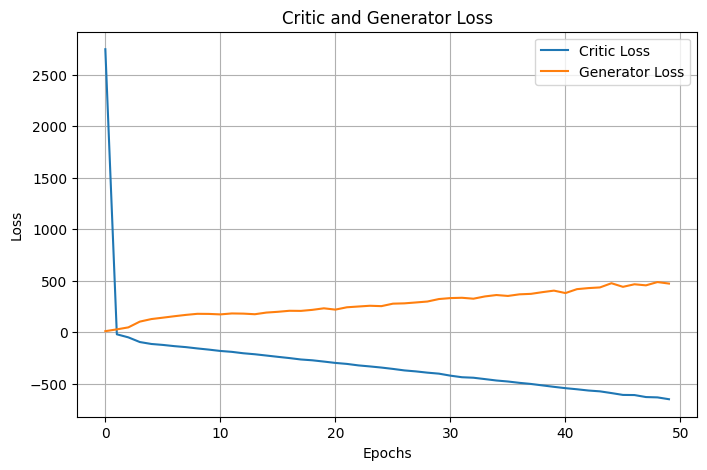

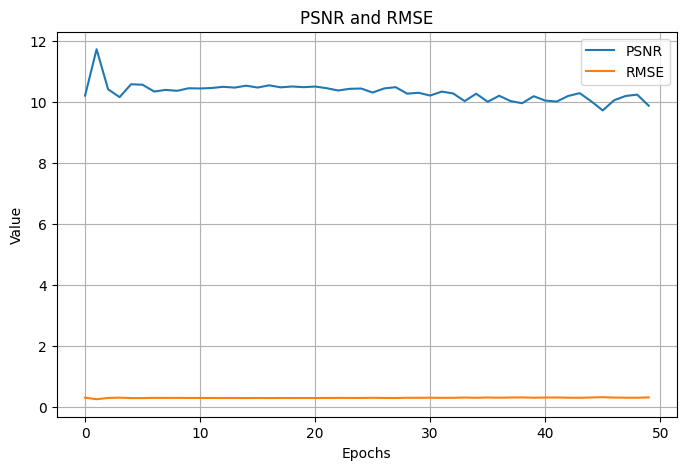

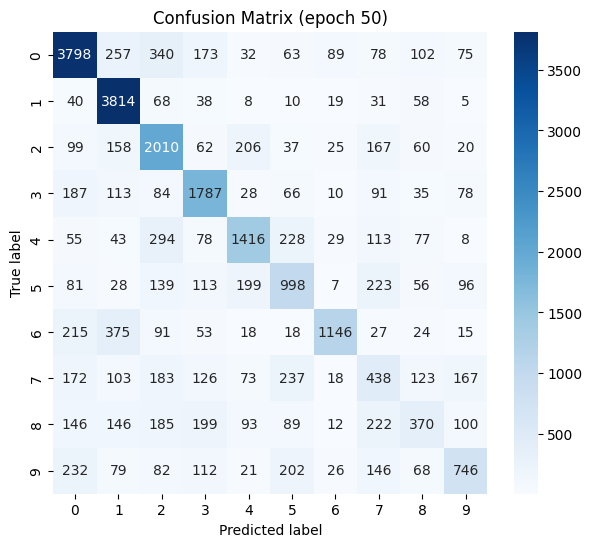

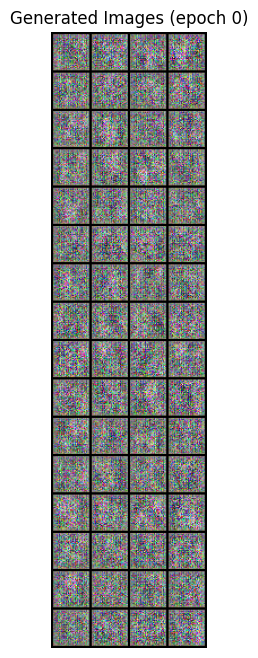

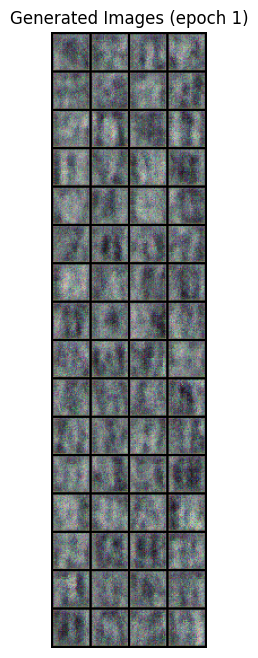

...

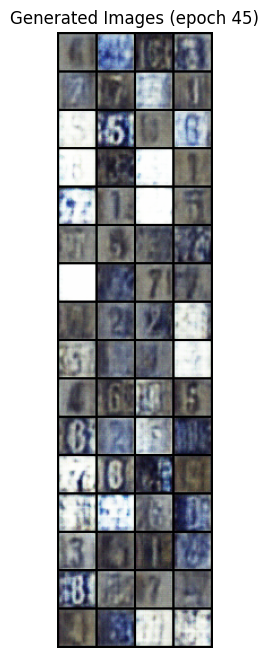

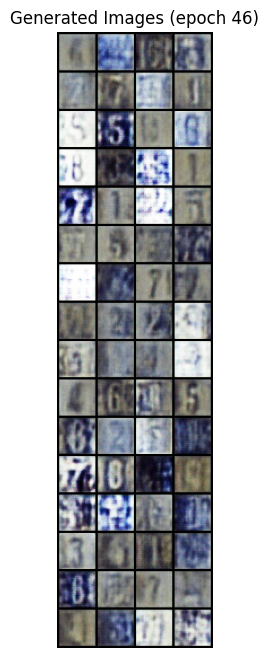

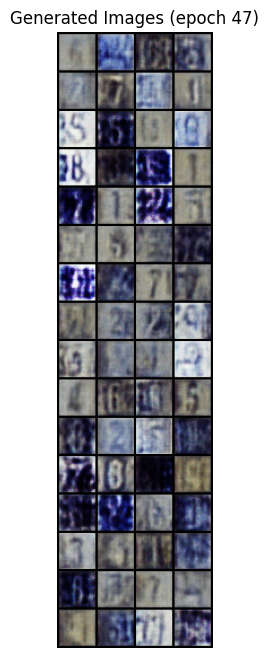

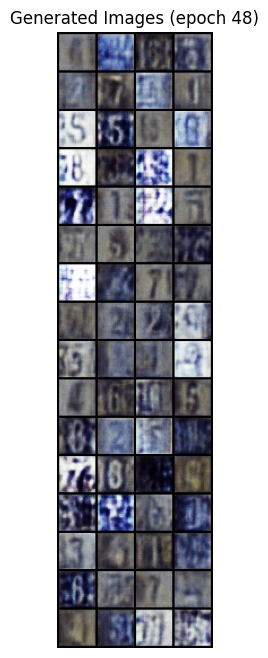

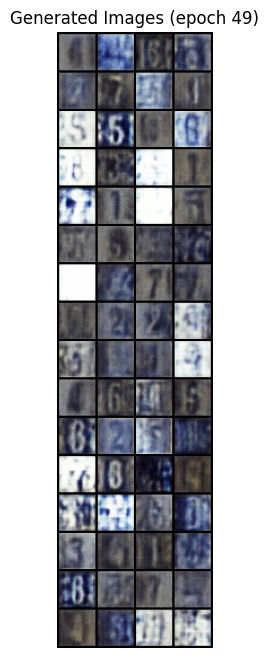

In [9]:
visualizer = NumberGeneratorVisualizer(trainer.history, NUM_CLASSES)
visualizer.plot_losses()
visualizer.plot_metrics()
visualizer.plot_cm()

for l in range(EPOCHS):
    visualizer.plot_grid(l)

# Test
Come test finale per capire l'effettivo funzionamento del modello possiamo caricare quest'ultimo e generare alcune immagini a partire da una label in input:

In [9]:
import torch

class NumberGeneratorPredictor:
    def __init__(
        self,
        model_path: str,
        num_classes: int,
        device: str):
        
        self.device = device
        self.model = ConvGenerator(num_classes, 100, 32, 3).to(self.device)
        self.model.load_state_dict(torch.load(model_path, map_location=self.device))
        
    def generate(
        self, 
        l: torch.Tensor
        ) -> torch.Tensor:
        """
        Genera un immagine con il modello di generazione immagini.

        Args:
            l (torch.Tensor): label in input.

        Returns:
            torch.Tensor: immagine generata
        """
        self.model.eval()
        with torch.no_grad():
            l = l.to(self.device)
            z = torch.randn(l.shape[0], self.model.nz, device=self.device)
            
            img = self.model(z, l)
        return img
        

## Start
Di seguito il codice per testare il generatore:

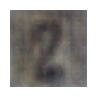

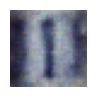

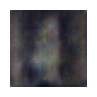

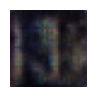

In [10]:
import matplotlib.pyplot as plt

predictor = NumberGeneratorPredictor(CHECKPOINT_PATH, NUM_CLASSES, DEVICE)

l = 0
while l != -1:
    l = int(input("Inserisci il numero da generare: "))
    if l >= 0 and l <= 9:
        img = predictor.generate(torch.tensor([l]))
        img = (img + 1) / 2 # [-1, 1] -> [0, 1]
        img = img[0].permute(1, 2, 0).detach().cpu().numpy() # [C, H, W] -> [H, W, C]
        
        plt.figure(figsize=(1, 1))
        plt.imshow(img)
        plt.axis("off")
        plt.show()

# Note
Sono state effettuate differenti prove di addestramento, molte di queste hanno avuto insuccesso, quest'ultima prova con gli attuali parametri ha ottenuto dei risultati buoni in 50 epoche.

Probabilmente sarebbe ancora migliorato con un numero di epoche maggiore.

Il fattore di successo è stato l'aumento della batch size, il che ha senso nel caso di una WGAN-GP:
- In una WGAN-GP la penalizzazione del gradiente dipende dalla media sul batch.
- Ciò comporta che dati batch più grandi avremmo una stime più accurata della norma del gradiente e quindi una penalizzazione più stabile.